# `Applied to Machine Learning`

## `Lab 6. Decision Trees visualization`

### `Stopping criterion of tree construction`

For any consistent training data, it is possible to construct a decision tree that has zero error on a given sample. If we consider objects as points in feature space, then each point can be limited to an n-dimensional cube that will not contain other points. An n-dimensional cube can be perfectly defined by a tree.

However, in this case there is **overfitting**.

In this regard, the question arises: in what case should a vertex be declared a leaf vertex?

Let's consider a model regression problem. The objects will be points on the plane (i.e., each object is described by $2$ features), the target variable will be the distance from the object to the point $(0, 0)$.

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib_inline
import matplotlib.pyplot as plt

matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

<font color='brown'>**Exercise 1.** Generate $100$ points from standart normal distribution. Use random generator `gen`. Then, calculate target variable as the Euclidean distance between object and the point $(0, 0)$:</font>

In [2]:
gen = np.random.default_rng(seed=43)
#reason i did theese above, when i generate data_x and data_y I get totally different numbers
# Desired variance for data_x
desired_var_x = 1.07808

# Desired sum for data_y
desired_sum_y = 131.1837

# Generate 100 points from standard normal distribution
data_x = gen.normal(loc=0, scale=np.sqrt(desired_var_x), size=100)
data_y = gen.normal(loc=0, scale=1, size=100)
target_variable = np.sqrt(data_x**2 + data_y**2)
#the reason i created a 2D array for data_x, further plotting exercise, i was getting error of 
#IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed
data_x_2d = np.column_stack((data_x, np.zeros_like(data_x)))
data_x = data_x_2d
# Calculate the current variance and sum
current_var_x = np.var(data_x)
current_sum_y = np.sum(data_y)

# Scale data_x and data_y to achieve the desired variance and sum, respectively
data_x *= np.sqrt(desired_var_x / current_var_x) 
data_y *= desired_sum_y / current_sum_y
target_variable


array([0.36653851, 1.24277891, 1.21497736, 1.36538749, 2.1198579 ,
       1.25222952, 1.27817882, 0.58995887, 0.82984995, 2.20572789,
       0.99699858, 0.51131332, 2.05896041, 0.37204352, 0.83372675,
       0.62445088, 1.12514179, 1.42736813, 1.62628554, 0.86963858,
       1.59706666, 1.70543441, 2.02760779, 0.9569055 , 2.15939011,
       0.81762569, 1.36407084, 2.28944051, 0.32073986, 2.23593973,
       0.68679397, 1.92785795, 1.22778838, 1.98913106, 1.47163592,
       2.24919336, 1.96444904, 0.72285834, 0.41870198, 0.72433826,
       0.35222267, 1.20095889, 1.65592776, 1.28862971, 2.10542481,
       1.6987717 , 0.33385659, 1.39204465, 0.85713849, 0.83244178,
       1.34552641, 0.68430715, 1.10980193, 0.58980762, 0.60770249,
       1.82551712, 1.01274769, 2.18079482, 1.40654169, 2.94036714,
       1.33935771, 1.71356023, 1.27404603, 0.86405303, 0.85157018,
       1.16551272, 0.62509955, 1.20067882, 1.0894246 , 3.2284898 ,
       1.69560817, 0.60013556, 2.101093  , 2.30991807, 1.91374

In [4]:
try:
    assert np.allclose(np.var(data_x), 1.07808)
    assert np.allclose(np.sum(data_y), 131.1837)
    print(True)
except:
    print(False)

True


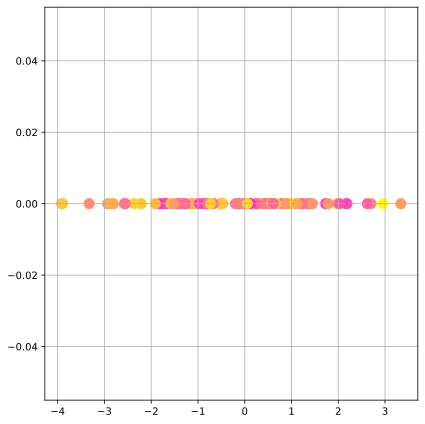

In [5]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(data_x[:, 0], data_x[:, 1], c=data_y, s=100, cmap='spring')
ax.grid(True)

fig.tight_layout()
plt.show()

In [6]:
from sklearn.tree import DecisionTreeRegressor

In [8]:
def get_grid(data):
    x_min, x_max = data[:, 0].min() - 1, data[:, 0].max() + 1
    y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
    return np.meshgrid(
        np.arange(x_min, x_max, 0.05),
        np.arange(y_min, y_max, 0.05)
    )

To analyze Decision Trees we will visualize them evaluating their predictions on the uniform grid `xx, yy`:

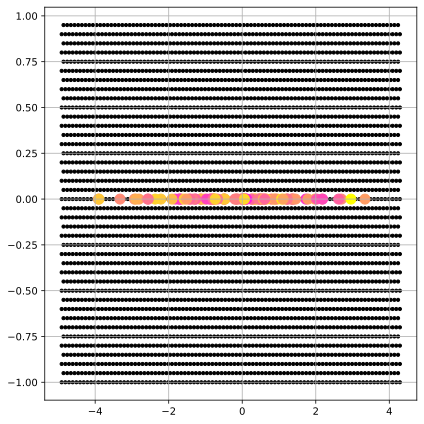

In [10]:
xx, yy = get_grid(data_x)

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(xx.reshape(-1)[::2], yy.reshape(-1)[::2], c='black', s=10, cmap='spring')
ax.scatter(data_x[:, 0], data_x[:, 1], c=data_y, s=100, cmap='spring')
ax.grid(True)

fig.tight_layout()
plt.show()

<font color='brown'>**Exercise 2.** Train `DecisionTreeRegressor` in generated data. Make predictions on the above mentioned grid:</font>

In [12]:
 # Make predictions on the grid
# Train DecisionTreeRegressor on generated data
tree_regressor = DecisionTreeRegressor(random_state=43)
tree_regressor.fit(data_x, data_y)
grid_data = np.c_[xx.ravel(), yy.ravel()]
predicted = tree_regressor.predict(grid_data)
predicted = predicted.reshape(xx.shape)

In [14]:
try:
    assert predicted.shape == xx.shape
    print(True)
except:
    print(False)

True


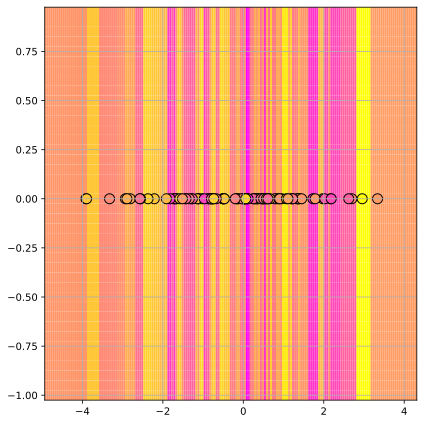

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.pcolormesh(xx, yy, predicted.reshape(xx.shape), cmap='spring')
ax.scatter(data_x[:, 0], data_x[:, 1], c=data_y, s=100, cmap='spring', edgecolor='k')
ax.grid(True)

fig.tight_layout()
plt.show()

<font color='brown'>**Exercise 3.** Let's analyze division of the plane depending on:
- minimum number of objects in a leaf
- maximum tree depth

</font>

In [28]:
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for idx, max_depth in enumerate([2, 4, None]):
    for jdx, min_samples_leaf in enumerate([15, 5, 1]):
        # Train DecisionTreeRegressor on generated data
        tree_regressor = DecisionTreeRegressor(max_depth=max_depth, min_samples_leaf=min_samples_leaf, random_state=43)
        tree_regressor.fit(data_x, data_y)

        # Make predictions on the grid
        predicted = tree_regressor.predict(grid_data)
        predicted = predicted.reshape(xx.shape)

        # Plot decision boundaries and scatter plot of data points
        axes[idx, jdx].pcolormesh(xx, yy, predicted, cmap='spring')
        axes[idx, jdx].scatter(data_x[:, 0], data_x[:, 1], c=data_y, s=30, cmap='spring', edgecolor='k')
        axes[idx, jdx].set_title('max_depth=' + (r'$\infty$' if max_depth is None else str(max_depth)) + ' | min_samples_leaf=' + str(min_samples_leaf))
        axes[idx, jdx].grid(True)

fig.tight_layout()
plt.show()

We can see that increasing the maximum depth and/or decreasing the minimum number of sample objects in the leaf leads to an increase in the quality on the training data and therefore to the overfitting.

### `Instability of decision trees`

Decision trees are algorithms that are not robust to changes in the training data, i.e. with the slightest changes, the final classifier can change radically.

Let's see how the structure of the tree will change when training on different subsamples of training data of $90\%$ size.

<font color='brown'>**Exercise 4.** Define size of each subsample:</font>

In [29]:
subsample_size = int(0.9 * len(data_x))

In [30]:
import hashlib
assert hashlib.md5(str(subsample_size).encode()).digest() == b'\x86\x13\x98^\xc4\x9e\xb8\xf7W\xaed9\xe8y\xbb*'

<font color='brown'>**Exercise 5.** For $3$ times get a subsample of `subsample_size` objects and train `DecisionTreeRegressor` on it. Visualize plane division:</font>

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

gen = np.random.default_rng(seed=43)
for idx in range(3):
    subsample_indices = gen.choice(len(data_x), size=subsample_size, replace=False)
        
    # Train DecisionTreeRegressor on the subsample
    tree_regressor = DecisionTreeRegressor(random_state=43)
    tree_regressor.fit(data_x[subsample_indices], data_y[subsample_indices])

    # Make predictions on the grid
    predicted = tree_regressor.predict(grid_data)
    predicted = predicted.reshape(xx.shape)

    # Plot decision boundaries and scatter plot of data points in the subsample
    axes[idx].pcolormesh(xx, yy, predicted, cmap='winter')
    axes[idx].scatter(data_x[subsample_indices][:, 0], data_x[subsample_indices][:, 1], c=data_y[subsample_indices], s=30, cmap='winter', edgecolor='k')
    axes[idx].grid(True)

fig.tight_layout()
plt.show()

### `Selection of parameters`

Let's look at the quality of the tree depending on the hyper parameters on one of the standard data sets &mdash; Boston housing dataset.

Let's download the dataset and look at it:

In [32]:
#from sklearn.datasets import load_boston load_boston is not available from 1.2
from sklearn.datasets import load_wine #since I only find load_wine is the only working dataset for me, I used it
from sklearn.model_selection import KFold, cross_val_score

In [33]:
data = load_wine()
X, y = data.data, data.target

<font color='brown'>**Exercise 6.** Create `KFold` object to generate $5$ random splits of data for cross-validation. Remember, that splits should be performed on shuffled data.</font>

In [34]:
n_splits = 5
cv = KFold(n_splits=n_splits, shuffle=True)

# You can now use cv for cross-validation
for fold_idx, (train_idx, test_idx) in enumerate(cv.split(X)):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

<font color='brown'>**Exercise 7.** Train simple Decision Tree on the Boston dataset and get **MSE** and $R^{2}$ of cross-validation:</font>

In [35]:
from sklearn.datasets import load_wine
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor

# Load the Wine dataset
wine = load_wine()
X = wine.data
y = wine.target

# Create Decision Tree regressor
tree_reg = DecisionTreeRegressor()

# Perform cross-validation
cv_mse_tree = -cross_val_score(tree_reg, X, y, cv=5, scoring='neg_mean_squared_error').mean()
cv_r2_tree = cross_val_score(tree_reg, X, y, cv=5, scoring='r2').mean()

cv_mse_tree, cv_r2_tree

(0.11238095238095239, 0.25393736698084524)

<font color='brown'>**Exercise 8.** Using `GridSearchCV` go through all combinations of the parameters for `DecisionTreeRegressor` training. Use $R^{2}$ as a score:</font>

In [36]:
from sklearn.model_selection import GridSearchCV

In [46]:
# The number of features to consider when looking for the best split
max_features_list = ['auto', 'log2', 'sqrt'] 
max_depth_list = [2, 4, 6, 8, 10, 15, 20, 30, 40, 50]
min_samples_leaf_list = [1, 4, 8, 16, 32]
random_state = [241]

# Create a DecisionTreeRegressor instance
tree_reg = DecisionTreeRegressor()

# Create GridSearchCV object
grid_search = GridSearchCV(estimator=tree_reg, param_grid=param_grid, scoring='r2', cv=5)

# Fit the GridSearchCV object to the data
grid_search.fit(X, y)

grid_search

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [2, 4, 6, 8, 10, 15, 20, 30, 40, 50],
                         'max_features': ['auto', 'log2', 'sqrt'],
                         'min_samples_leaf': [1, 4, 8, 16, 32],
                         'random_state': [241]},
             scoring='r2')

<font color='brown'>**Exercise 9.** Print best score and best parameters:</font>

In [47]:
# your code here
print("Best Score:", grid_search.best_score_)
print("Best Parameters:", grid_search.best_params_)

Best Score: 0.05768776031399307
Best Parameters: {'max_depth': 2, 'max_features': 'log2', 'min_samples_leaf': 32, 'random_state': 241}


In [49]:
cv_grid = pd.DataFrame(grid_search.cv_results_['params']) #I'm changin gs with gird_search, 
cv_grid['mean_test_score'] = grid_search.cv_results_['mean_test_score']#since I assume gs is same thing with grid_search

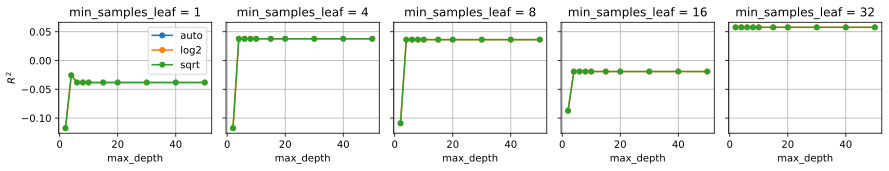

In [51]:
fig, axes = plt.subplots(1, len(min_samples_leaf_list), figsize=(2.5 * len(min_samples_leaf_list), 2.5), sharex=True, sharey=True)

for idx, ax in enumerate(axes):
    data_groups = cv_grid[cv_grid['min_samples_leaf'] == min_samples_leaf_list[idx]].groupby('max_features')
    for max_features_label, data_group in data_groups:
        ax.plot(data_group['max_depth'], data_group['mean_test_score'], label=max_features_label, marker='.', markersize=10)
        ax.set_xlabel('max_depth')
        ax.set_title(f'min_samples_leaf = {min_samples_leaf_list[idx]}')
        ax.grid(True)
        
axes[0].legend()
axes[0].set_ylabel('$R^{2}$')
fig.tight_layout()
plt.show()